In [1]:
import os
# os.environ["CUDA_VISIBLE_DEVICES"] = ''
# os.environ['HF_HOME'] = ''

import json
from PIL import Image
import matplotlib.pyplot as plt
import argparse
from datetime import datetime
import numpy as np
import sys
sys.path.append('fkd_diffusers')

import torch
from diffusers import DDIMScheduler

from launch_eval_runs import do_eval

/home/revant/Documents/Fk-Diffusion-Steering/venv/lib/python3.12/site-packages/diffusers/schedulers/scheduling_dpmsolver_multistep.py:30: UserWarning: A NumPy version >=1.22.4 and <2.3.0 is required for this version of SciPy (detected version 2.3.5)
  import scipy.stats


In [2]:
reward_types = ["HumanPreference", "PoseValidity", "MixPoseValidityAndHumanPreference"]

In [3]:
# Set args
"""
model_choices:

stable-diffusion-xl
stable-diffusion-v1-5
stable-diffusion-v1-4
stable-diffusion-2-1
"""

args = dict(
    seed=0,
    output_dir="output", 
    eta=1.0,
    metrics_to_compute="PoseValidity", 
    prompt_path='./prompt_files/image_rewards_benchmark.json', 
    model_name="stable-diffusion-v1-5", 
  )

fkd_args = dict(
    lmbda=2.0,
    num_particles=4,
    adaptive_resampling=True,
    resample_frequency=20,
    time_steps=100,
    potential_type='max',
    resampling_t_start=20,
    resampling_t_end=50,
    guidance_reward_fn='PoseValidity',
    use_smc=True,
   )

args = argparse.Namespace(**args, **fkd_args)
args

Namespace(seed=0, output_dir='output', eta=1.0, metrics_to_compute='PoseValidity', prompt_path='./prompt_files/image_rewards_benchmark.json', model_name='stable-diffusion-v1-5', lmbda=2.0, num_particles=4, adaptive_resampling=True, resample_frequency=20, time_steps=100, potential_type='max', resampling_t_start=20, resampling_t_end=50, guidance_reward_fn='PoseValidity', use_smc=True)

In [4]:
args.num_inference_steps = fkd_args["time_steps"]
fkd_args

{'lmbda': 2.0,
 'num_particles': 4,
 'adaptive_resampling': True,
 'resample_frequency': 20,
 'time_steps': 100,
 'potential_type': 'max',
 'resampling_t_start': 20,
 'resampling_t_end': 50,
 'guidance_reward_fn': 'PoseValidity',
 'use_smc': True}

In [5]:
# seed everything
torch.manual_seed(args.seed)
torch.cuda.manual_seed(args.seed)
torch.cuda.manual_seed_all(args.seed)

In [7]:
# set output directory
cur_time = datetime.now().strftime("%Y%m%d-%H%M%S")
output_dir = os.path.join(args.output_dir, cur_time)
os.makedirs(output_dir, exist_ok=False)
arg_path = os.path.join(output_dir, "args.json")
with open(arg_path, "w") as f:
    json.dump(vars(args), f, indent=4)

score_path = os.path.join(output_dir, "scores.jsonl")
images_path = os.path.join(output_dir, "images")
os.makedirs(images_path, exist_ok=False)

metrics_to_compute = args.metrics_to_compute.split("#")


# cache metric fns
do_eval(
    prompt=["test"],
    images=[Image.new("RGB", (224, 224))],
    metrics_to_compute=metrics_to_compute,
    )


Hello eval time
Loading ViTPose...
ViTPose loaded
Loading VAE model from /home/revant/Documents/Fk-Diffusion-Steering/swimming_pose_reward/pose_vae_side_swimming.pt...
Standardization parameters loaded from model file
VAE model loaded and ready


{'PoseValidity': {'result': [-10.0],
  'mean': -10.0,
  'std': nan,
  'max': -10.0,
  'min': -10.0}}

In [8]:
from fks_utils import get_model

pipeline = get_model(args.model_name)
print("Using model:", args.model_name)
pipeline = pipeline.to("cuda")


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Using model: stable-diffusion-v1-5


In [9]:
# add prompts for generation
prompt_data = [
    {"prompt": "A swimmer performing the backstroke in a swimming pool, side view, realistic lighting and water reflections."},
    {"prompt": "A swimmer doing the breaststroke, viewed from a slightly elevated diagonal angle showing the side of the body, realistic lighting and water reflections."},
    {"prompt": "A swimmer performing the butterfly stroke, top-down view, realistic lighting and water reflections."},
    {"prompt": "A swimmer doing freestyle, side view from underwater, realistic lighting"},
    {"prompt": "Side view of a swimmer, freestyle stroke."},
    {"prompt": "A swimmer doing the freestyle, side view, splashing water."},
    {"prompt": "Side view, swimmer, freestyle, breathing."},
    {"prompt": "Underwater side view, full body, swimmer, freestyle kick."},
]

len(prompt_data)

8

In [13]:
show_best_particle = False

A swimmer performing the backstroke in a swimming pool, side view, realistic lighting and water reflections.
Args: {'lmbda': 2.0, 'num_particles': 4, 'adaptive_resampling': True, 'resample_frequency': 20, 'time_steps': 100, 'potential_type': 'max', 'resampling_t_start': 20, 'resampling_t_end': 50, 'guidance_reward_fn': 'PoseValidity', 'use_smc': True}


  0%|          | 0/100 [00:00<?, ?it/s]

`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
Hello eval time


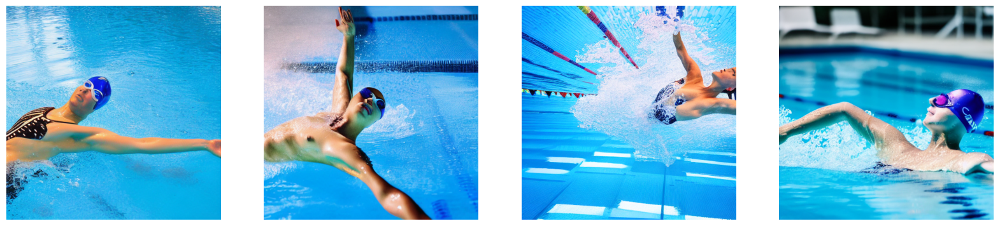

A swimmer doing the breaststroke, viewed from a slightly elevated diagonal angle showing the side of the body, realistic lighting and water reflections.
Args: {'lmbda': 2.0, 'num_particles': 4, 'adaptive_resampling': True, 'resample_frequency': 20, 'time_steps': 100, 'potential_type': 'max', 'resampling_t_start': 20, 'resampling_t_end': 50, 'guidance_reward_fn': 'PoseValidity', 'use_smc': True}


  0%|          | 0/100 [00:00<?, ?it/s]

`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
Hello eval time


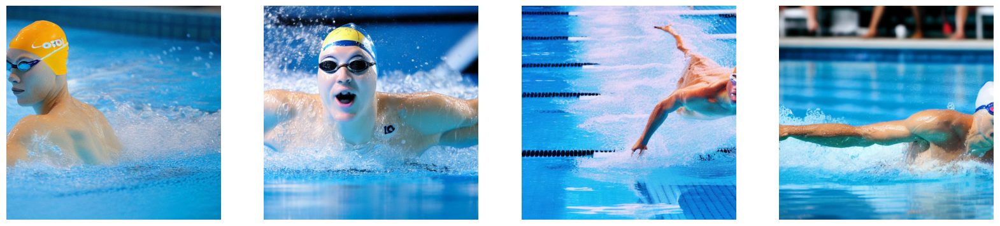

A swimmer performing the butterfly stroke, top-down view, realistic lighting and water reflections.
Args: {'lmbda': 2.0, 'num_particles': 4, 'adaptive_resampling': True, 'resample_frequency': 20, 'time_steps': 100, 'potential_type': 'max', 'resampling_t_start': 20, 'resampling_t_end': 50, 'guidance_reward_fn': 'PoseValidity', 'use_smc': True}


  0%|          | 0/100 [00:00<?, ?it/s]

`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
Hello eval time


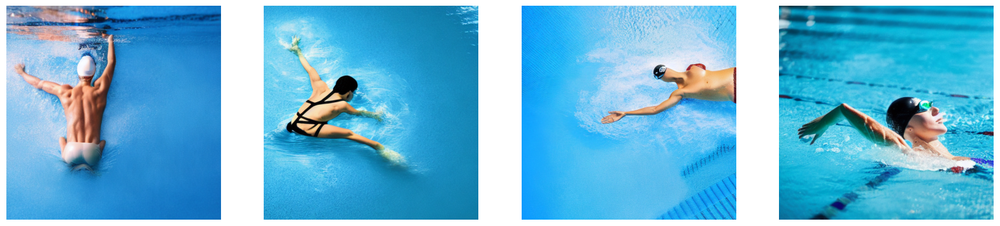

A swimmer doing freestyle, side view from underwater, realistic lighting
Args: {'lmbda': 2.0, 'num_particles': 4, 'adaptive_resampling': True, 'resample_frequency': 20, 'time_steps': 100, 'potential_type': 'max', 'resampling_t_start': 20, 'resampling_t_end': 50, 'guidance_reward_fn': 'PoseValidity', 'use_smc': True}


  0%|          | 0/100 [00:00<?, ?it/s]

`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
Hello eval time


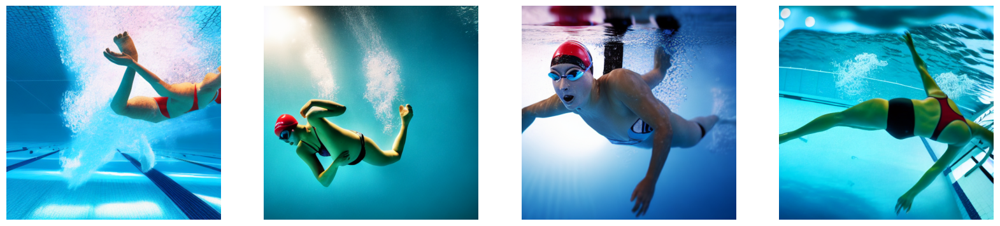

Side view of a swimmer, freestyle stroke.
Args: {'lmbda': 2.0, 'num_particles': 4, 'adaptive_resampling': True, 'resample_frequency': 20, 'time_steps': 100, 'potential_type': 'max', 'resampling_t_start': 20, 'resampling_t_end': 50, 'guidance_reward_fn': 'PoseValidity', 'use_smc': True}


  0%|          | 0/100 [00:00<?, ?it/s]

`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
Hello eval time


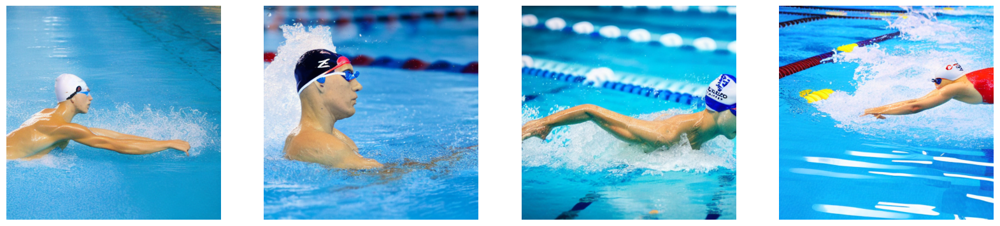

A swimmer doing the freestyle, side view, splashing water.
Args: {'lmbda': 2.0, 'num_particles': 4, 'adaptive_resampling': True, 'resample_frequency': 20, 'time_steps': 100, 'potential_type': 'max', 'resampling_t_start': 20, 'resampling_t_end': 50, 'guidance_reward_fn': 'PoseValidity', 'use_smc': True}


  0%|          | 0/100 [00:00<?, ?it/s]

`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
Hello eval time


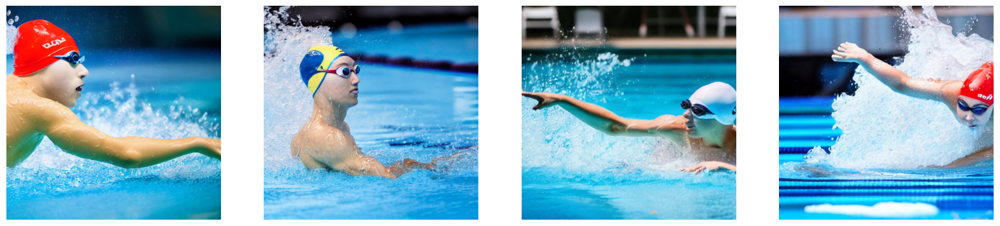

Side view, swimmer, freestyle, breathing.
Args: {'lmbda': 2.0, 'num_particles': 4, 'adaptive_resampling': True, 'resample_frequency': 20, 'time_steps': 100, 'potential_type': 'max', 'resampling_t_start': 20, 'resampling_t_end': 50, 'guidance_reward_fn': 'PoseValidity', 'use_smc': True}


  0%|          | 0/100 [00:00<?, ?it/s]

`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
Hello eval time


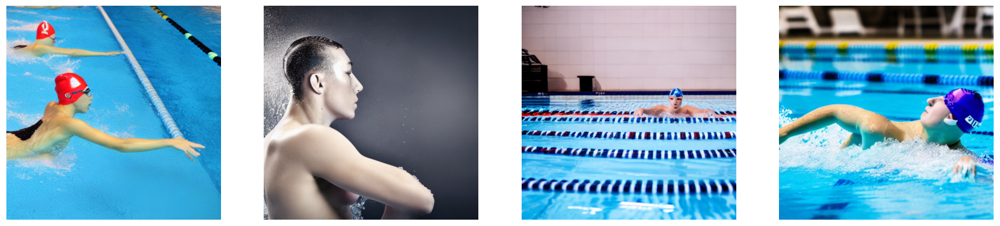

Underwater side view, full body, swimmer, freestyle kick.
Args: {'lmbda': 2.0, 'num_particles': 4, 'adaptive_resampling': True, 'resample_frequency': 20, 'time_steps': 100, 'potential_type': 'max', 'resampling_t_start': 20, 'resampling_t_end': 50, 'guidance_reward_fn': 'PoseValidity', 'use_smc': True}


  0%|          | 0/100 [00:00<?, ?it/s]

`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
`metric_to_chase` will be ignored as it only applies to 'LLMGrader' as the `reward_name`
Hello eval time


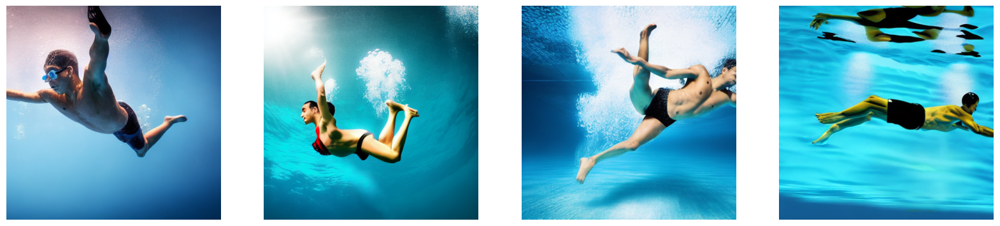

In [14]:
with open(score_path, "w") as score_f:
    for prompt_idx, item in enumerate(prompt_data):
        print(item['prompt'])
        torch.manual_seed(0)
        torch.cuda.manual_seed(0)
        torch.cuda.manual_seed_all(0)
        
        
        prompt = [item['prompt']]*fkd_args['num_particles']
        start_time = datetime.now()
        
        images = pipeline(prompt, 
                          num_inference_steps=fkd_args["time_steps"], 
                          eta=args.eta,
                          fkd_args=fkd_args)
        end_time = datetime.now()        
        images = images[0]

        time_taken = end_time - start_time
        
        results = do_eval(prompt=prompt, images=images, metrics_to_compute=metrics_to_compute)
        guidance_reward = np.array(results["PoseValidity"]["result"])
        sorted_idx = np.argsort(guidance_reward)[::-1]
        images = [images[i] for i in sorted_idx]
        
        results['time_taken'] = time_taken.total_seconds()
        results['prompt'] = prompt
        results['prompt_index'] = prompt_idx

        image_fpath = os.path.join(images_path, f"{prompt_idx}.png")
        results['image_path'] = image_fpath

        score_f.write(json.dumps(results) + "\n")
        
        if show_best_particle:
            _, ax = plt.subplots(1, 1, figsize=(5, 5))            
            ax.imshow(images[0])
            ax.axis("off")
        else:
            _, ax = plt.subplots(1, args.num_particles, figsize=(args.num_particles*5, 5))
            for i, image in enumerate(images):
                ax[i].imshow(image)
                ax[i].axis("off")
                
        # plt.suptitle(prompt[0])
        plt.savefig(image_fpath)
        plt.show()
        plt.close()


In [10]:
from diffusers import StableDiffusionPipeline

pipe_sd = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16
)
pipe_sd = pipe_sd.to("cuda")
print("Loaded vanilla Stable Diffusion v1-5 (no FK Steering)")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loaded vanilla Stable Diffusion v1-5 (no FK Steering)


A swimmer performing the backstroke in a swimming pool, side view, realistic lighting and water reflections.


  0%|          | 0/50 [00:00<?, ?it/s]

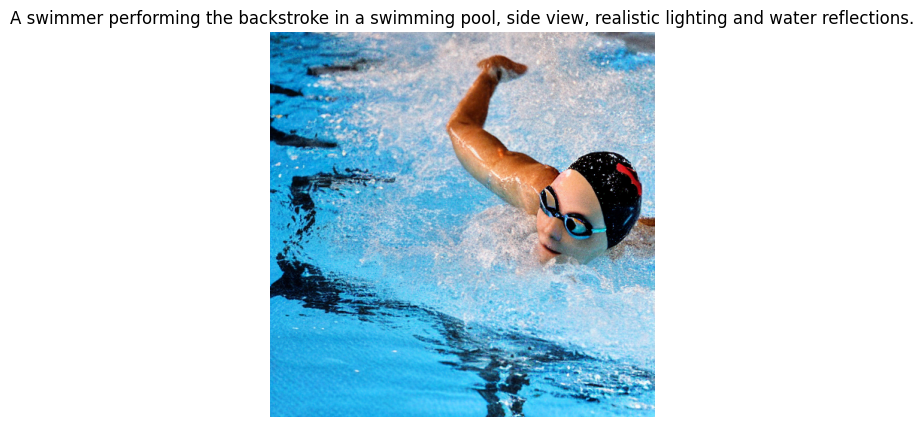

A swimmer doing the breaststroke, viewed from a slightly elevated diagonal angle showing the side of the body, realistic lighting and water reflections.


  0%|          | 0/50 [00:00<?, ?it/s]

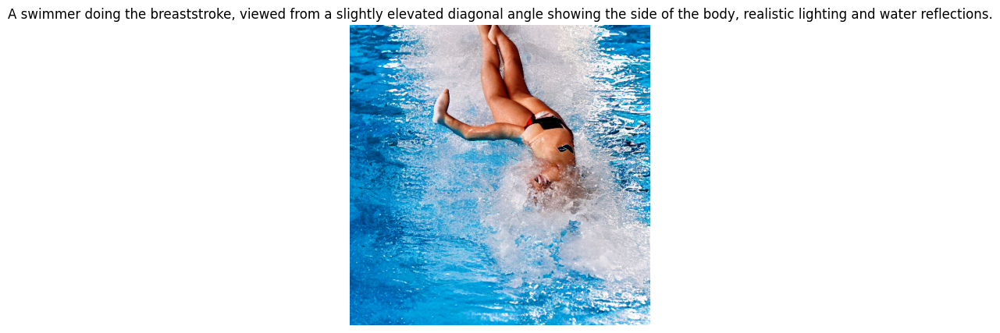

A swimmer performing the butterfly stroke, top-down view, realistic lighting and water reflections.


  0%|          | 0/50 [00:00<?, ?it/s]

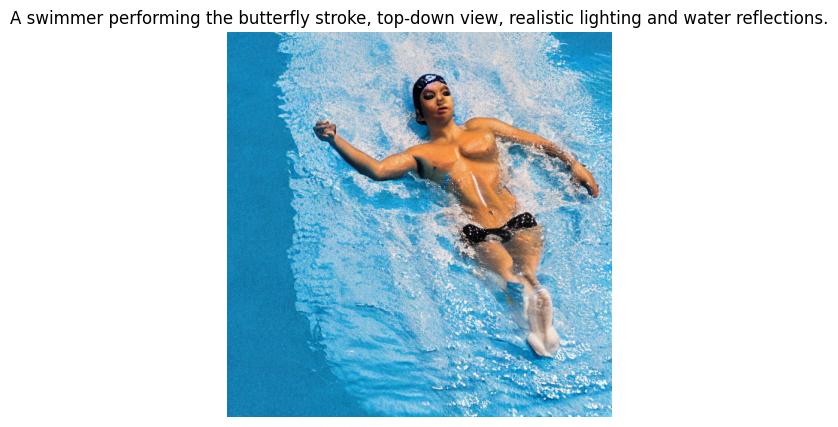

A swimmer doing freestyle, side view from underwater, realistic lighting


  0%|          | 0/50 [00:00<?, ?it/s]

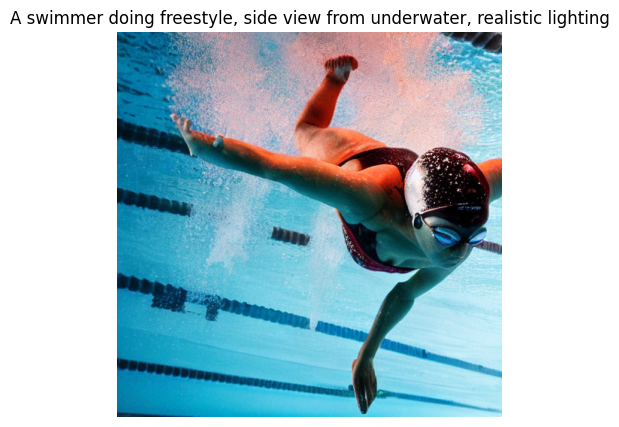

Side view of a swimmer, freestyle stroke.


  0%|          | 0/50 [00:00<?, ?it/s]

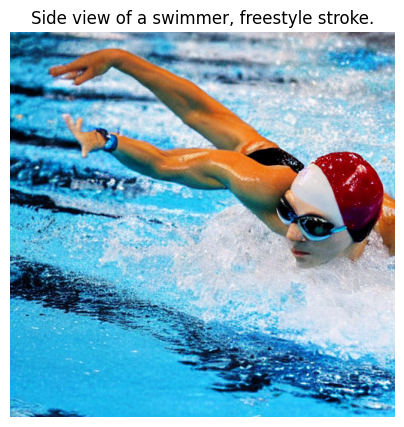

A swimmer doing the freestyle, side view, splashing water.


  0%|          | 0/50 [00:00<?, ?it/s]

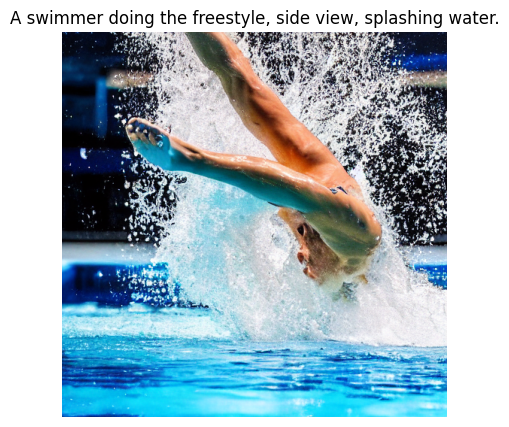

Side view, swimmer, freestyle, breathing.


  0%|          | 0/50 [00:00<?, ?it/s]

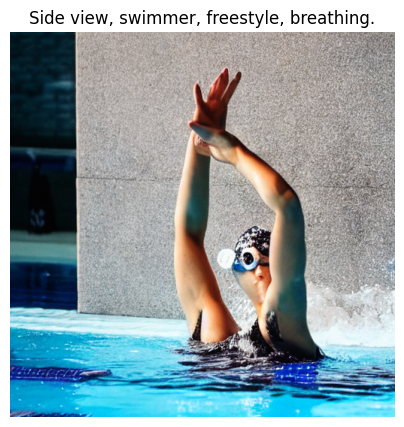

Underwater side view, full body, swimmer, freestyle kick.


  0%|          | 0/50 [00:00<?, ?it/s]

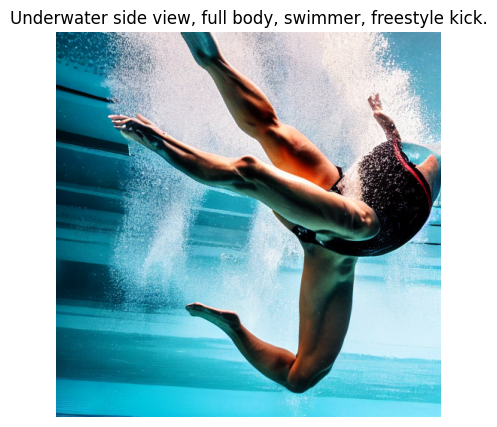

In [11]:
with open(score_path, "w") as score_f:
    for prompt_idx, item in enumerate(prompt_data):
        prompt_text = item["prompt"]
        print(prompt_text)
        torch.manual_seed(0)
        start_time = datetime.now()

        out = pipe_sd(
            prompt=prompt_text,
            num_inference_steps=50, 
            guidance_scale=7.5 
        )
        image = out.images[0]

        end_time = datetime.now()
        time_taken = (end_time - start_time).total_seconds()

        image_fpath = os.path.join(images_path, f"{prompt_idx}.png")
        image.save(image_fpath)

        result_record = {
            "prompt": prompt_text,
            "prompt_index": prompt_idx,
            "time_taken": time_taken,
            "image_path": image_fpath
        }
        score_f.write(json.dumps(result_record) + "\n")

        plt.figure(figsize=(5,5))
        plt.imshow(image)
        plt.axis("off")
        # plt.title(prompt_text)
        plt.savefig(image_fpath)
        plt.show()
        plt.close()

In [12]:
experiment_output_ids = {
    "20251121-181917": "Vanilla SD v1.5",
    "20251121-180043": "FK Steering with Human Preference Reward",
    "20251121-190817": "FK Steering with Pose Reward",
    "20251121-203542": "FK Steering with Mixed Pose and Human Preference Reward"
}

Found indices: [0, 1, 2, 3, 4, 5, 6, 7]


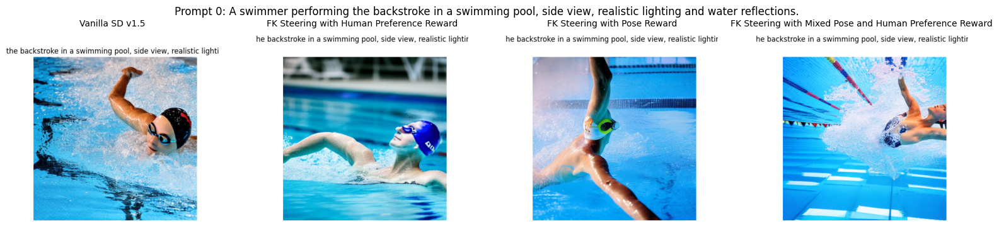

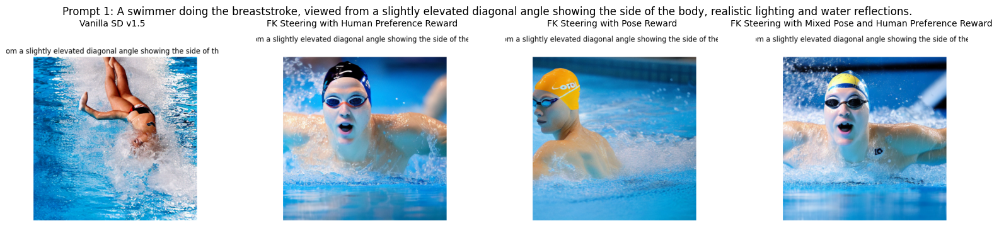

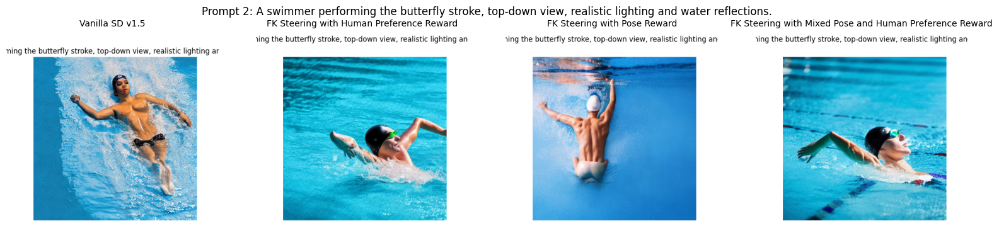

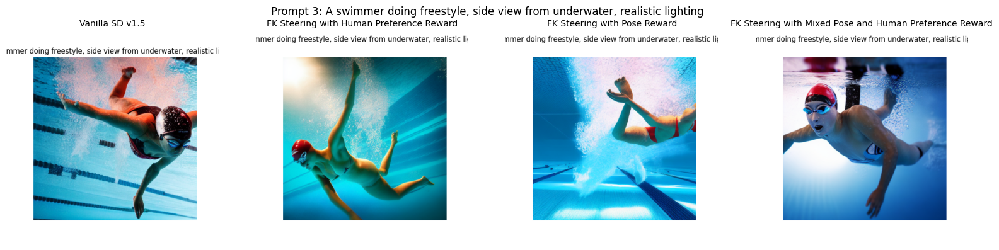

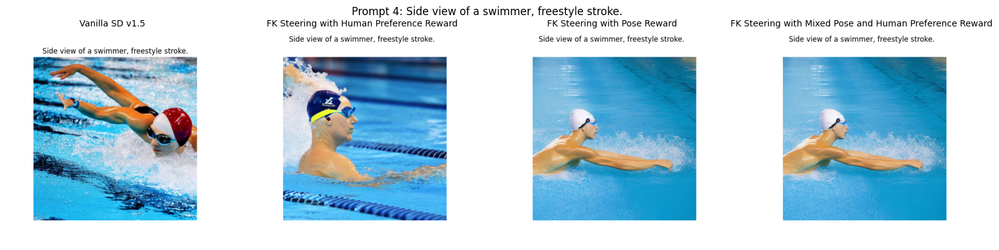

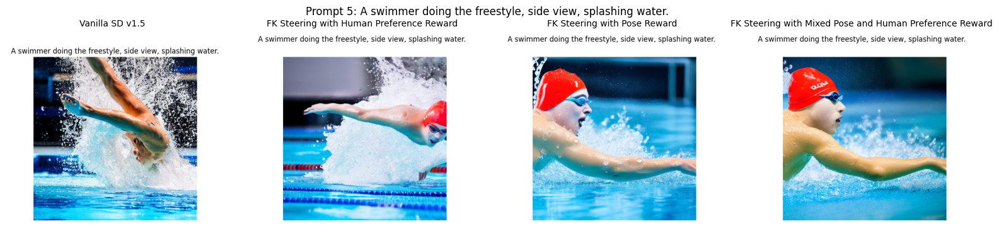

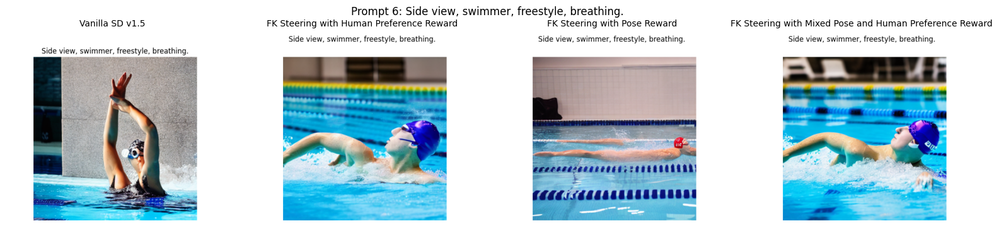

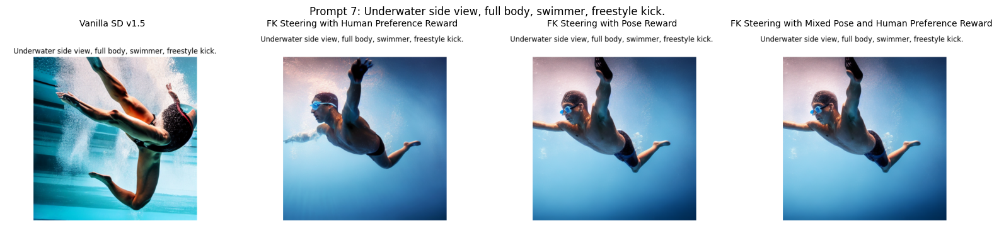

In [13]:
# Visual comparison grid across experiments
import os
from PIL import Image
import matplotlib.pyplot as plt

root_out = "output"  # base outputs directory
exp_ids = experiment_output_ids  # dict: run_id -> title

# Collect image file count from first experiment
first_run = next(iter(exp_ids.keys()))
images_dir = os.path.join(root_out, first_run, "images")
if not os.path.isdir(images_dir):
    raise FileNotFoundError(f"Images directory missing: {images_dir}")

# Assume files named 0.png, 1.png, ...
indices = sorted(
    int(f.split(".")[0]) for f in os.listdir(images_dir) if f.endswith(".png")
)
print("Found indices:", indices)

# Build mapping of run_id -> images directory
run_image_dirs = {
    run_id: os.path.join(root_out, run_id, "images") for run_id in exp_ids
}

# Sanity check same count
for run_id, d in run_image_dirs.items():
    missing = [i for i in indices if not os.path.isfile(os.path.join(d, f"{i}.png"))]
    if missing:
        raise RuntimeError(f"Run {run_id} missing indices: {missing}")

# Use prompt_data for row titles (prompt text)
prompt_texts = [item["prompt"] for item in prompt_data]
if len(prompt_texts) < len(indices):
    print("Warning: fewer prompts than images; titles may be truncated.")

for i in indices:
    fig, axes = plt.subplots(1, len(exp_ids), figsize=(4 * len(exp_ids), 4))
    if len(exp_ids) == 1:
        axes = [axes]
    for ax, (run_id, title) in zip(axes, exp_ids.items()):
        img_path = os.path.join(run_image_dirs[run_id], f"{i}.png")
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(title, fontsize=10)
        ax.axis("off")
    row_title = prompt_texts[i] if i < len(prompt_texts) else f"Prompt {i}"
    fig.suptitle(f"Prompt {i}: {row_title}", fontsize=12)
    plt.tight_layout()
    plt.show()
    plt.close()